# Detección de basurales en imágen aérea con un modelo de clasificación por redes neuronales

## Inteligencia artificial para monitorear basurales

En los ultimos años se ha vuelto cada vez más accesible la adquisición de imágenes aéreas y satelitales de alta resolución, de cualquier región del mundo. En el mismo período a madurado a gran velocidad la capacidad de tecnologías de inteligencia artificial, y en particular las redes neuronales, para realizar reconocimiento de objetos de interés en imágenes. La conjunción de estas dos tendencias llevó a la Fundación Bunge y Born a proponerse la creación de un algoritmo, fácil de implementar, que detecte y mapee basurales en bases a imágenes.  

El proyecto culminó con éxito al generar un algoritmo, entrenado con imágenes satelitales, que demostró su eficacia en la [detección de grandes basurales a cielo abierto en la Provincia de Buenos Aires](https://www.fundacionbyb.org/_files/ugd/2aae47_03757f467e384554b8d88ffd26c60af3.pdf).

En un tutorial previo, "[Entrenamiento](https://colab.research.google.com/drive/1rToKykOzwwd8oWI2E-wobTkx7lbUrTeo?usp=sharing)", mostramos el flujo de trabajo requerido para entrenar una red neuronal capaz detección de objetos de interés -en nuestro caso, basurales a cielo abierto.  

Ahora practicaremos la aplicación de un modelo ya entrenado para la detección de basurales en cualquier imagen que dispongamos como input.


## Software requerido

Para aplicar el algoritmo de detección de microbasurales utilizaremos funciones especializadas que reducen en gran medida la complejidad de las tareas a llevar a cabo. En particular, las que provee la librería open-source [rastervision](https://rastervision.io/).


Descargamos el código fuente de rastervision:

In [1]:
%%sh
rm -rf raster-vision/
git clone https://github.com/azavea/raster-vision.git

Couldn't find program: 'sh'


Y lo instalamos: (de paso, instalamos también `gdown`, una libreria para descargar datos de Google Drive que nos va a servir luego)

In [2]:
!pip install rastervision

  Using cached rastervision-0.31.1-py3-none-any.whl.metadata (6.0 kB)
  Using cached rastervision_pipeline-0.31.1-py3-none-any.whl.metadata (741 bytes)
  Using cached rastervision_aws_s3-0.31.1-py3-none-any.whl.metadata (653 bytes)
  Using cached rastervision_aws_batch-0.31.1-py3-none-any.whl.metadata (619 bytes)
  Using cached rastervision_core-0.31.1-py3-none-any.whl.metadata (1.0 kB)
  Using cached rastervision_pytorch_learner-0.31.1-py3-none-any.whl.metadata (958 bytes)
  Using cached rastervision_pytorch_backend-0.31.1-py3-none-any.whl.metadata (701 bytes)
  Using cached shapely-2.0.6-cp312-cp312-win_amd64.whl.metadata (7.2 kB)
  Using cached geopandas-1.0.1-py3-none-any.whl.metadata (2.2 kB)
  Using cached pyproj-3.7.0-cp312-cp312-win_amd64.whl.metadata (31 kB)
  Using cached rasterio-1.4.1-cp312-cp312-win_amd64.whl.metadata (9.4 kB)
  Using cached opencv_python_headless-4.10.0.84-cp37-abi3-win_amd64.whl.metadata (20 kB)
  Using cached stackstac-0.5.1-py3-none-any.whl.metadata (8

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
aiobotocore 2.12.3 requires botocore<1.34.70,>=1.34.41, but you have botocore 1.35.34 which is incompatible.


In [3]:
# !pip install raster-vision/rastervision_pipeline/
# !pip install raster-vision/rastervision_core/
# !pip install raster-vision/rastervision_pytorch_learner/
# !pip install raster-vision/rastervision_aws_s3/
# !pip install raster-vision/rastervision_pytorch_backend/

!pip install gdown

  Using cached gdown-5.2.0-py3-none-any.whl.metadata (5.8 kB)
Using cached gdown-5.2.0-py3-none-any.whl (18 kB)


Última instalación...

In [4]:
!sudo apt-get install gdal-bin

'sudo' is not recognized as an internal or external command,
operable program or batch file.


Ahora reiniciamos a sesión para que los componentes recién instalados queden disponibles. En Colab, lo hacemos cliqueando en la barra superior la opción `Runtime` y en en el menú desplegable `Restart runtime`.

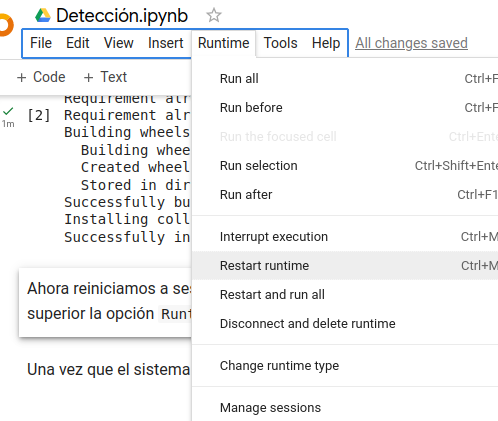

Una vez que el sistema reinicia, procedemos directo al siguiente paso (no hace falta volver a ejecutar las celdas anteriores)

## Conexión con Google Drive

Como hicimos en el tutorial previo, vamos a conectar esta instancia de Google Colab a nuestro espacio de almacenamiento en Google Drive.

Al ejecutar la siguiente celda obtendremos un cuadro de diálogo donde se nos pide confirmar que otorgamos acceso a nuestros archivos en Drive. Diremos que si.

In [5]:
# from google.colab import drive
# drive.mount('/content/drive')

Y ahora, todo listo para trabajar.

### Librerías

Para empezar, cargamos todas las librerías de funciones que vamos a necesitar:

In [6]:
import os
import subprocess
import rastervision
import rasterio

# os.environ['GDAL_DATA'] = check_output('pip show rasterio | grep Location | awk \'{print $NF"/rasterio/gdal_data/"}\'', shell=True).decode().strip()
# os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'


# Find the location of the 'rasterio' package using pip
try:
    result = subprocess.check_output('pip show rasterio', shell=True).decode('utf-8')

    # Extract the location of the 'rasterio' package
    for line in result.splitlines():
        if line.startswith('Location:'):
            rasterio_location = line.split(':')[-1].strip()
            break
    
    # Set GDAL_DATA environment variable
    gdal_data_path = os.path.join(rasterio_location, 'rasterio', 'gdal_data')
    os.environ['GDAL_DATA'] = gdal_data_path
    print(f"GDAL_DATA has been set to: {gdal_data_path}")

except subprocess.CalledProcessError as e:
    print("Error finding the location of rasterio:", e)

# Set AWS_NO_SIGN_REQUEST environment variable
os.environ['AWS_NO_SIGN_REQUEST'] = 'YES'
print("AWS_NO_SIGN_REQUEST has been set to: YES")

GDAL_DATA has been set to: \Users\oltie\anaconda3\Lib\site-packages\rasterio\gdal_data
AWS_NO_SIGN_REQUEST has been set to: YES


In [7]:

import glob
from pathlib import Path

import gc

import os

import torch

from rastervision.core.data import ClassConfig
from rastervision.core.data import SemanticSegmentationLabels, SemanticSegmentationDiscreteLabels
from rastervision.core.data import RasterioSource, MinMaxTransformer
from rastervision.core.data.label_store.semantic_segmentation_label_store_config import PolygonVectorOutputConfig

from rastervision.pytorch_learner import SemanticSegmentationLearner
from rastervision.pytorch_learner import SolverConfig
from rastervision.pytorch_learner import SemanticSegmentationLearnerConfig
from rastervision.pytorch_learner import SemanticSegmentationSlidingWindowGeoDataset
from rastervision.pytorch_learner import SemanticSegmentationGeoDataConfig

## Obteniendo un modelo de detección de basurales

En el [tutorial previo](https://colab.research.google.com/drive/1rToKykOzwwd8oWI2E-wobTkx7lbUrTeo?usp=sharing) mostramos como entrenar una red neuronal capaz de identificar basura -o cualquier otra categoría de objetos de interés- en imágenes aéreas.

El proceso produjo un "modelo", un archivo que contiene instrucciones -un algoritmo- que puede ser alimentado con imágenes nuevas, cuyo contenido no conocemos, para obtener "predicciones": esto es, áreas en las imagenes donde se determina que existe una alta posibilidad de basura.

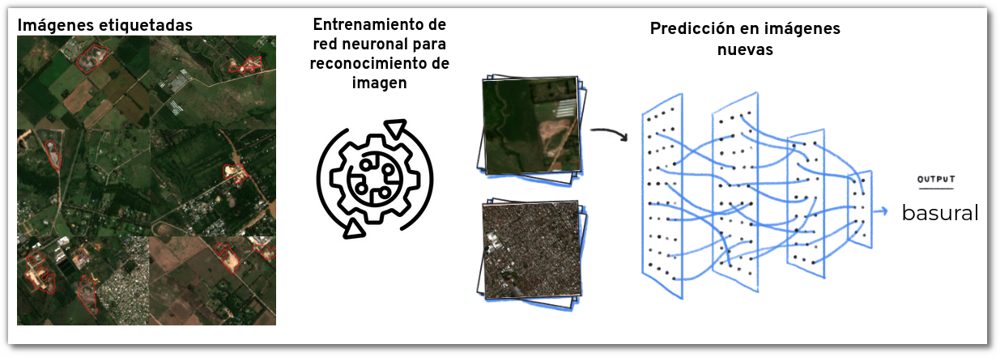

Descargamos el modelo previamente entrenado, y lo guardamos en la carpeta "IA", y subcarpeta "basurales", en nuestro espacio de Google Drive al que hemos conectado antes:

In [8]:
# import gdown

# model_folder = "/content/drive/MyDrive/IA/basurales/modelo_pre_entrenado/"
model_folder = "./data/model/"
# !mkdir -p $model_folder
# model_url = "https://drive.google.com/file/d/1DdjZBPrMNsCp35tZSk7u-EgnIYe0wDu9/view?usp=sharing"
model_path = "./data/model/model-bundle.zip"

# gdown.download(model_url, model_path, fuzzy=True)

Reconstruimos el modelo

In [9]:
class_config = ClassConfig(
    names=['background', 'asentamiento informal'],
    colors=['lightgray', 'darkred'],
    null_class='background')
class_config.ensure_null_class()


window_size = 480

model = torch.hub.load(
    'AdeelH/pytorch-fpn:0.3',
    'make_fpn_resnet',
    name='resnet18',
    fpn_type='panoptic',
    num_classes=len(class_config),
    fpn_channels=128,
    in_channels=3,
    out_size=(window_size, window_size),
    pretrained=True)


learner = SemanticSegmentationLearner.from_model_bundle(model_bundle_uri=model_path, model=model, output_dir=model_folder, training=False)

Using cache found in C:\Users\oltie/.cache\torch\hub\AdeelH_pytorch-fpn_0.3
2024-10-05 14:03:54:rastervision.pytorch_learner.learner: INFO - Loading learner from bundle ./data/model/model-bundle.zip.
2024-10-05 14:03:54:rastervision.pytorch_learner.learner: INFO - Unzipping model-bundle to C:\Users\oltie\AppData\Local\Temp\tmpvarnxqqq\model-bundle
2024-10-05 14:03:55:rastervision.pytorch_learner.learner: INFO - Loading model weights from: C:\Users\oltie\AppData\Local\Temp\tmpvarnxqqq\model-bundle\model.pth


### Imagen

El primer sitio donde aplicar el modelo de detección de basurales que hemos entrenado suele ser el contexto de los datos utilizados para su entrenamiento.
Así podemos determinar si el modelo tiene sesgos pronunciados en

- sus falsos positivos (zonas similares, sin basura, que tienden a ser identificadas)

- sus falsos negativos (determinados tipos de basural que no son detectados)

Descargamos entonces la misma imagen que usamos como input para el tutorial de entrenamiento. Ahora vamos a aplicar el modelo que entrenamos antes para evaluar que tan bien reconstruye las áreas de basurales identificadas por inspección humana.

In [10]:
year = 2021

In [11]:
import urllib.request

# Define the URL and destination file path
image_url = "https://oin-hotosm.s3.amazonaws.com/5fe36263ee72110005bc0b60/0/5fe36263ee72110005bc0b61.tif"
image_file_dest = f"./data/img/{year}.tif"

# # Download the file
# urllib.request.urlretrieve(image_url, image_file_dest)

# print(f"Downloaded {image_url} to {image_file_dest}")


In [12]:
# !wget $image_url -O $image_file_dest

El procesamiento de imágenes de tamaño considerable, como la que estamos usando, consume con facilidad toda la memoria RAM que ofrece Google Colab e impide completar el proceso.

Para evitarlo, antes de realizar el proceso de detección dividimos la imagen en porciones más chicas, de modo que puedan ser procesadas con la capacidad de procesamiento disponible. En este caso, vamos a recortar la imagen original según una cuadrícula de 4 rectángulos de ancho por 3 de alto.  Estos números son arbitrarios y elegidos porque funcionaron bien en la prática. Podrían ser otros, o incluso procesar la imagen completa sin necesidad de dividirla... si contáramos con un sistema más potente.

In [1]:
# !conda install -c conda-forge gdal

^C


corregir quilombo con osgeo (lo tengo descargado localmente)

In [1]:
import subprocess
from osgeo import gdal
import sys

# En cuantos pedazos (a lo largo y a lo alto) partimos la imagen?
tiles_wide = 1000
tiles_high = 5000
# la carpeta, y prfijo en el nombre de archivo
# donde vamos a dejar los resultados
out_prefix = './tmp/sliced_'

# borramos recortes previos que pudiera haber
for file in glob.glob(out_prefix + "*"):
    os.remove(file)

def gdalwarp(*args):
    return subprocess.check_call(['gdalwarp'] + list(args))

ds = gdal.Open(image_file_dest)
gt = ds.GetGeoTransform()

width_px = ds.RasterXSize
height_px = ds.RasterYSize

# obtener coordenadas de la esquina inferior izquierda
xmin = int(gt[0])
xmax = int(gt[0] + (gt[1] * width_px))

# Obtener coordenadas de la esquina superior derecha
if gt[5] > 0:
    ymin = int(gt[3] - (gt[5] * height_px))
else:
    ymin = int(gt[3] + (gt[5] * height_px))

ymax = int(gt[3])

# Print calculated coordinates for debugging
print(f"Calculated Coordinates: xmin={xmin}, xmax={xmax}, ymin={ymin}, ymax={ymax}")
# dividir altura y ancho en n secciones
# por ejemplo, n = 2 producirá 4 (2 x 2) mosaicos
# (y probablemente unos cuantos mosaicos extra por el redondeo)

# Get image dimensions and print them
print("Width in pixels:", width_px)
print("Height in pixels:", height_px)


# Check if the number of tiles exceeds the image dimensions
if tiles_wide > width_px or tiles_high > height_px:
    raise ValueError("Number of tiles exceeds image dimensions.")

# Calculate tile width and height safely
tile_width = (xmax - xmin) // tiles_wide
tile_height = (ymax - ymin) // tiles_high

print("Tiles wide:", tiles_wide)
print("Tiles high:", tiles_high)

for x in range(xmin, xmax, tile_width):
    for y in range(ymin, ymax, tile_height):
        gdalwarp('-te', str(x), str(y), str(x + tile_width),
                 str(y + tile_height), '-multi', '-wo', 'NUM_THREADS=ALL_CPUS',
                 '-wm', '500', image_file_dest, out_prefix + '{}_{}.tif'.format(x, y))

NameError: name 'glob' is not defined

Guardamos en una variable todas las imágenes parciales que hemos creado, y mostramos la lista en pantalla:

In [15]:
raster_files = glob.glob(out_prefix + '*.tif')

In [16]:
raster_files

['./tmp\\sliced_-58_-35.tif', './tmp\\sliced_-59_-35.tif']

Ahora definimos una funcion auxiliar, que se encarga de

- tomar una imagen
- generar predicciones en toda su superficier aplicando el modelo de detección
- guardar los resultados en un archivo de polígonos georreferenciados

In [17]:
#def generate_prediction_polygons(raster_file, aoi_uri, class_config, learner, save_dir):
def generate_prediction_polygons(raster_file, class_config, learner, save_dir):

    print(f'Processing {raster_file}...')

    img_raster_source = RasterioSource(raster_file, allow_streaming=True, raster_transformers=[MinMaxTransformer()])

    pred_ds = SemanticSegmentationSlidingWindowGeoDataset.from_uris(
        class_config=class_config,
        image_uri=raster_file,
        image_raster_source_kw=dict(allow_streaming=True),
        #aoi_uri=aoi_uri,
        size=window_size,
        stride=window_size)

    predictions = learner.predict_dataset(
        pred_ds,
        raw_out=True,
        numpy_out=True,
        predict_kw=dict(out_shape=(window_size, window_size)),
        progress_bar=True)

    pred_labels = SemanticSegmentationLabels.from_predictions(
        pred_ds.windows,
        predictions,
        smooth=True,
        extent=pred_ds.scene.extent,
        num_classes=len(class_config))

    # liberamos memoria
    del pred_ds
    gc.collect()

    # Guardar predicciones
    pred_labels.save(
        uri=save_dir,
        crs_transformer=img_raster_source.crs_transformer,
        class_config=class_config,
        # set to False to skip writing `labels.tif`
        discrete_output=False,
        # set to False to skip writing `scores.tif`
        smooth_output=False,
        # set to True to quantize floating point score values to uint8 in scores.tif to reduce file size
        smooth_as_uint8=True,
        # vector outputs are now always written to <pred root URI>/vector_outputs/class-<i>-<class name>.json
        vector_outputs=[PolygonVectorOutputConfig(class_id=1)]
    )

    # renombramos el archivo con la predicción
    old_file = os.path.join(save_dir, "vector_output", "class-1-basural.json")
    new_file = os.path.join(save_dir, "vector_output", f"{Path(raster_file).stem}_prediction.json")

    if os.path.exists(old_file):
        os.rename(old_file, new_file)
    else:
        print(f"El archivo {old_file} no existe.")
    # !mv {save_dir + "vector_output/class-1-basural.json"} {save_dir + "vector_output/" + Path(raster_file).stem + "_prediction.json"}

    # limpieza final
    del predictions
    del pred_labels
    gc.collect()

    print(f'Done: {raster_file}\n'
    )

Y para obtener la predicción de todo el territorio, iniciamos un _loop_ que aplique la función de detección a cada imagen parcial, y lueco combine los resultados en un archivo unificado:

In [18]:
save_dir = "/tmp/predicciones/"
!mkdir -p $save_dir

#aoi_uri = AoI_file_dest

for raster_file in raster_files:
    #generate_prediction_polygons(raster_file, aoi_uri, class_config, learner, save_dir)
    generate_prediction_polygons(raster_file, class_config, learner, save_dir)

Processing ./tmp\sliced_-58_-35.tif...


The syntax of the command is incorrect.


Predicting:   0%|          | 0/441 [00:00<?, ?it/s]

2024-10-04 15:41:42:rastervision.core.data.label_store.semantic_segmentation_label_store: INFO - Writing vector outputs to disk.


Vectorizing predictions:   0%|          | 0/1 [00:00<?, ?it/s]

El archivo /tmp/predicciones/vector_output\class-1-basural.json no existe.
Done: ./tmp\sliced_-58_-35.tif

Processing ./tmp\sliced_-59_-35.tif...


Predicting:   0%|          | 0/441 [00:00<?, ?it/s]

2024-10-04 15:43:27:rastervision.core.data.label_store.semantic_segmentation_label_store: INFO - Writing vector outputs to disk.


Vectorizing predictions:   0%|          | 0/1 [00:00<?, ?it/s]

El archivo /tmp/predicciones/vector_output\class-1-basural.json no existe.
Done: ./tmp\sliced_-59_-35.tif



combinar y disolver los resultados parciales

In [19]:
predictions_dest = "./preds/"
!mkdir -p $predictions_dest

import geopandas as gpd

partial_results = glob.glob(save_dir + "vector_output/*.json")

results = gpd.GeoDataFrame()

for file in partial_results:
    results = gpd.GeoDataFrame(gpd.pd.concat([results, gpd.read_file(file)]))

results.to_file(predictions_dest + "predicciones.geojson", driver="GeoJSON")

The syntax of the command is incorrect.


In [26]:
!ls {predictions_dest + "predicciones.geojson"}

'ls' is not recognized as an internal or external command,
operable program or batch file.


El primer sitio donde aplicar el modelo de detección de basurales que hemos entrenado suele ser el contexto de los datos utilizados para su entrenamiento.
Así podemos determinar si el modelo tiene sesgos pronunciados tanto en
sus falsos positivos (zonas similares, sin basura, que tienden a ser identificadas)
sus falsos negativos (determinados tipos de basural que no son detectados


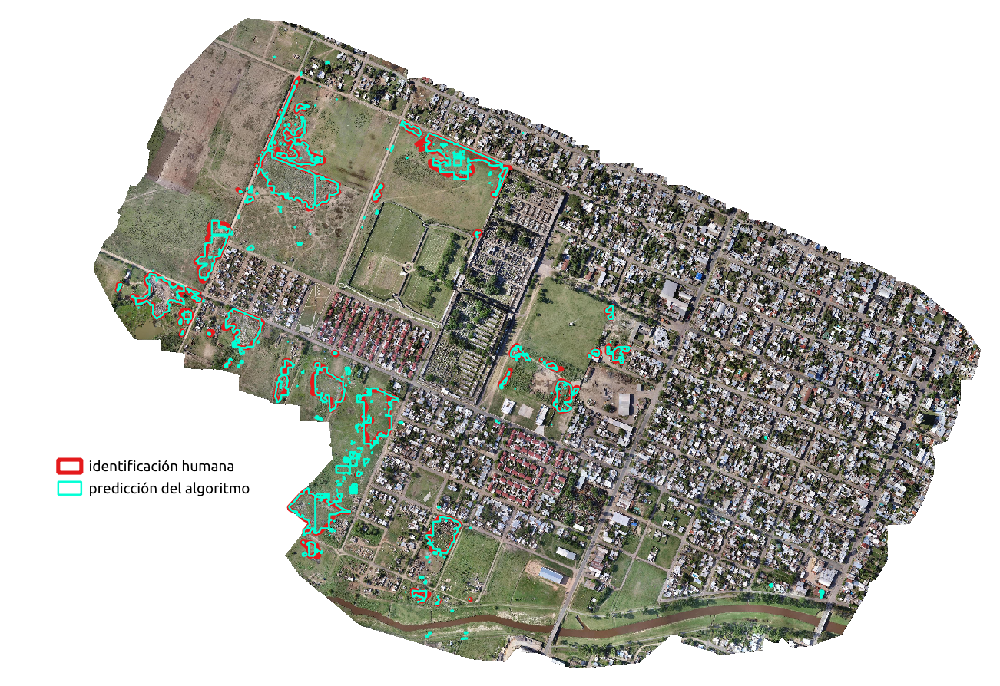

El algoritmo detecta zonas de la imagen de entrenamiento donde se observa basura, aún cuando no habían sido delimitadas en las anotaciones

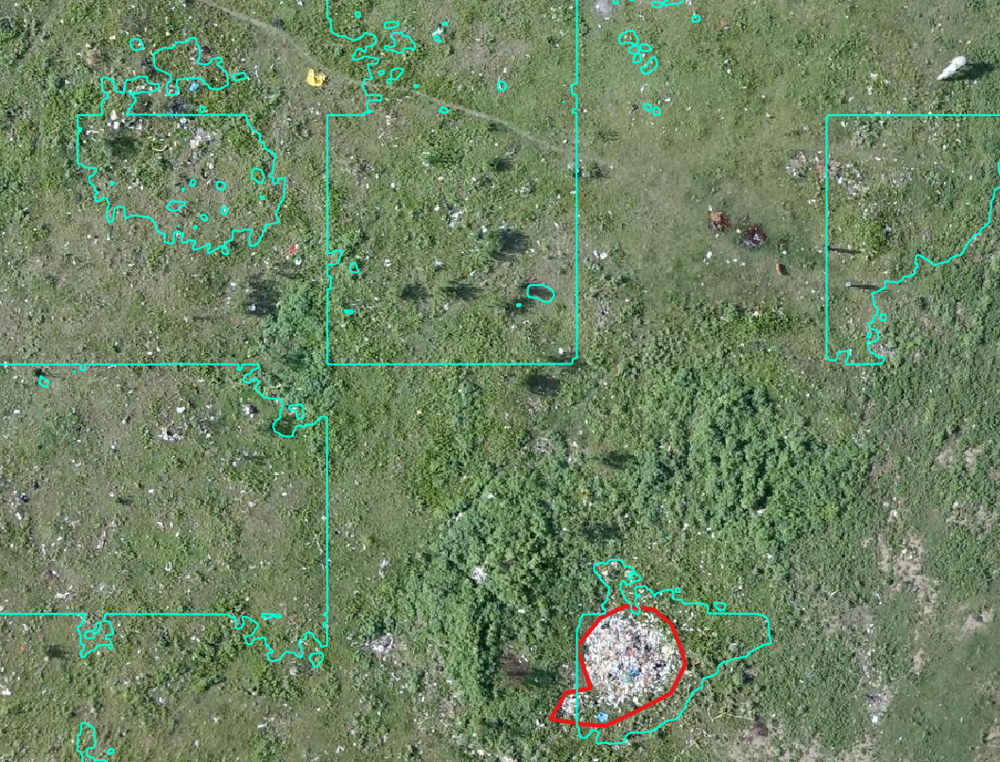

También presenta algunas instancias (¡infrecuentes!) donde el algoritmo se confunde con alguna textura en techos de metal, y la señala como basura:

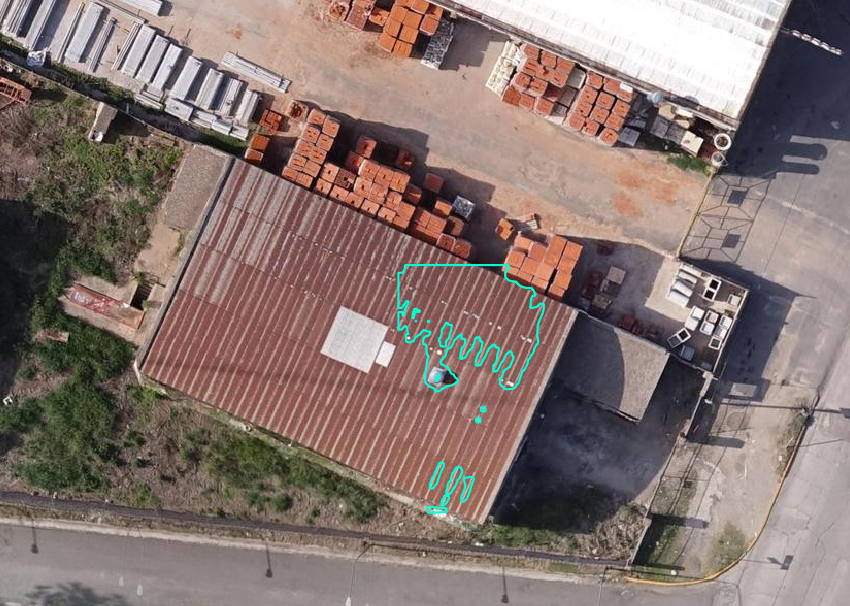

En resumidas cuentas, resultados satisfactorios. El algoritmo es capaz de señalar todos los basurales identificados por personas, además de algunas áreas com basura no indicadas en los datos de entrenamiento.

Los casos de falsos positivos, como en el techo metálico, se pueden corregir mediante la ejecución de más ciclos de entrenamiento usando un área de interés que incluya los sitios que confunden al algoritmo. Al presentar estas zonas que no coinciden con los polígonos que indican la presencia de basura nos aseguramos que el algoritmo tenga exposición a estos casos y aprenda a desestimarlos.

## Predicción en imagen nueva

Si resolvimos los pasos previos, realizar esto es simple. Sólo hay que ejecutar la misma secuencia, pero esta vez utilizar una imagen distinta como input. Por ejemplo, en la celda donde definimos la imagen que vamos a utilizar, podemos reemplazar la línea con el origen del archivo por:

`image_url = "https://oin-hotosm.s3.amazonaws.com/5fe3689aff40f100073ca180/0/5fe3689aff40f100073ca181.tif`

Se trata de otra imagen en la misma ciudad, que luce así:

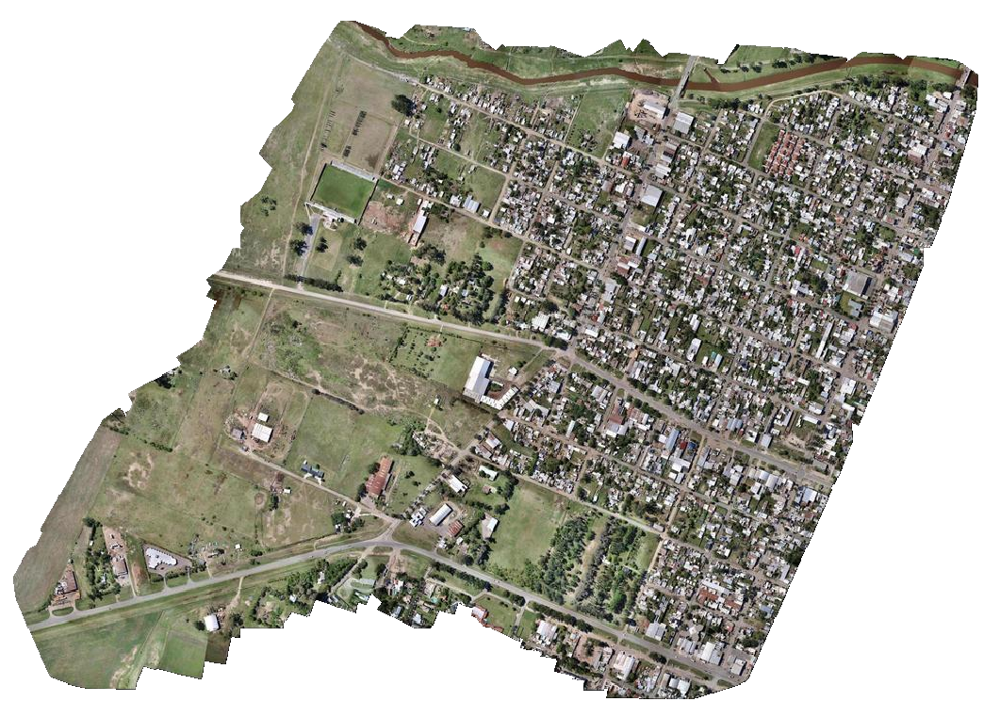

Al completar el proceso de detección, obtenemos este resultado:

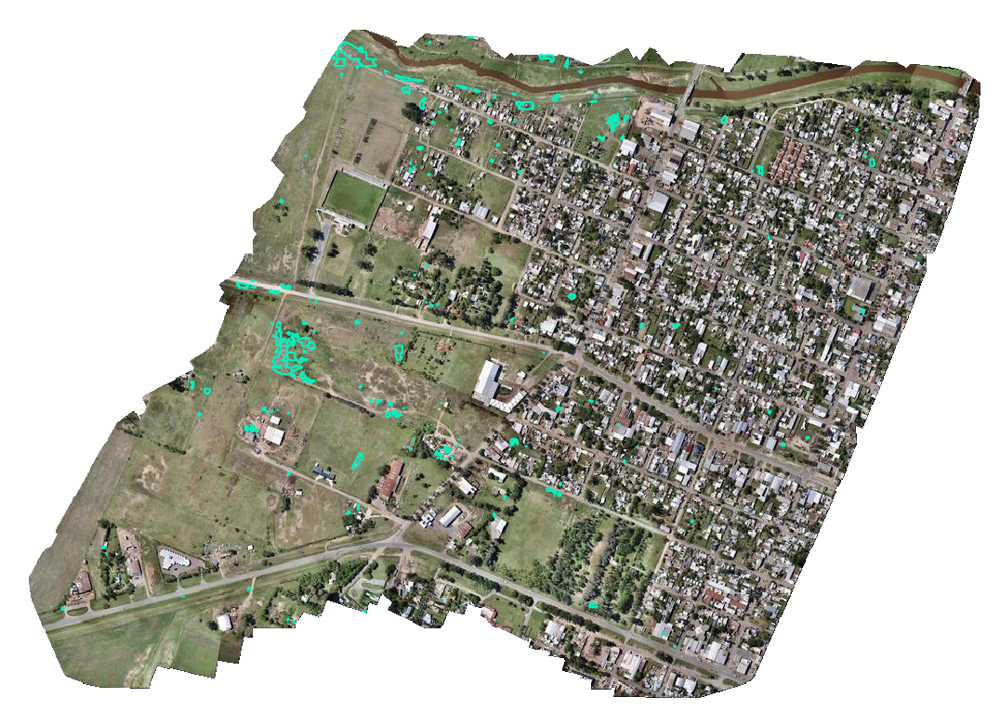

Una vez más, los resultados son satisfactorios. El algoritmo detecta las áreas de la imagen que presentan basura, incluso en configuraciones "novedosas" como el lote con restos de incineración en el tercer ejemplo:

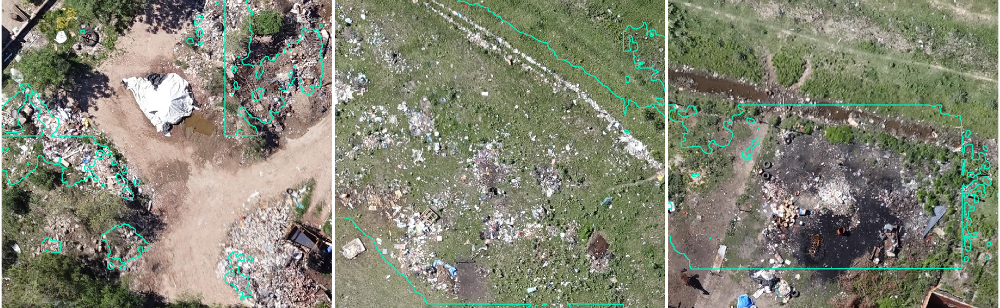

Y como es casi inevitable, encontramos también algunos falsos positivos, como la textura en un techo metálico que ya habíamos observado. Sin embargo, en este caso no sólo son infrecuentes sino que algunos son difíciles de discernir incluso tras una revisión cuidadosa.

Los contenedores en el ejemplo del centro podrían ser basura -en caso de que estén abandonados- o no, si se encuentran acopiados allí como parte de algún proceso lícito. Y en el ejemplo de la derecha encontramos apenas una mancha azul celeste entre la vegetación. ¿Se trata quizás de residuos plásticos? ¿Debería importarnos una cantidad tan pequeña?

Estas preguntas dependen de cada contexto, y nos recuerdan que nunca será posible automatizar al 100% un procedimiento de estudio o gestión del territorio.

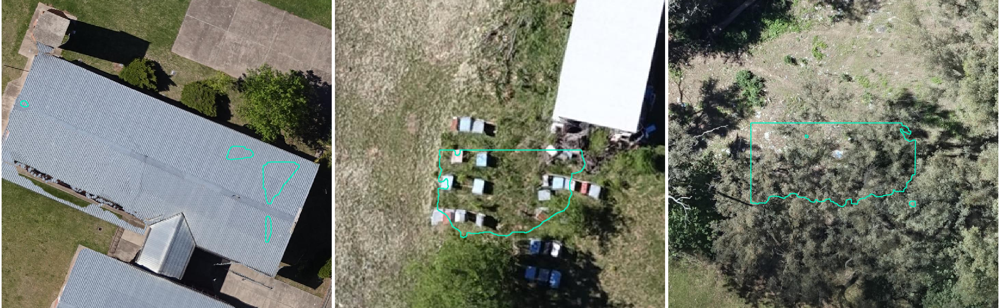

En todo caso, los resultados correctos que obtenemos tras aplicar el modelo nos sirven como insumo para continuar su entrenamiento y mejorar su performance.

Agregar nuevas imágenes y etiquetas de basurales mejora la performance, en particular incrementando la capacidad de realizar predicciones válidas en mayor variedad de contextos.

Para ello se realizan iteraciones del mismo procedimiento visto hasta aquí. Al conjunto inicial de imágenes + anotaciones se les suman nuevos sets, obtenidos tras la aplicación del algoritmo de detección, y se retoma el proceso de entrenamiento para obtener un algoritmo más potente.

¡Este ciclo puede continuar por tiempo indefinido!
